### Environment Setup & Data Loading

In [1]:
# Import necessary libraries for deep learning and data handling
import os
import pickle
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt



In [2]:
# Checking if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

def find_image_dir():
    """
    Search for the Flickr30k image directory within the environment.
    Kaggle ya Colab mein dataset ka path dhoondnay ke liye function.
    """
    base_input = '/kaggle/input' # Default path for Kaggle
    if not os.path.exists(base_input):
        base_input = './' # Local or Colab path

    for root, dirs, files in os.walk(base_input):
        # We look for a directory that contains many .jpg files
        if len([f for f in files if f.endswith('.jpg')]) > 1000:
            return root
    return None

IMAGE_DIR = find_image_dir()
if IMAGE_DIR:
    print(f"Found images at: {IMAGE_DIR}")
else:
    print("Dataset directory not found. Please upload or link the Flickr30k dataset.")

Using device: cuda
Dataset directory not found. Please upload or link the Flickr30k dataset.


### Step 2: Setting Kaggle Token & Downloading

In [3]:
import kagglehub
import os

# Download the latest version of the dataset
path = kagglehub.dataset_download("adityajn105/flickr30k")

print("Path to dataset files:", path)

# List files to see the structure
print("Files in dataset:", os.listdir(path))

# Assignment requirement ke mutabiq IMAGE_DIR aur captions file path set krain
IMAGE_DIR = os.path.join(path, 'Images')
CAPTIONS_FILE = os.path.join(path, 'captions.txt')

if os.path.exists(IMAGE_DIR):
    print(f"Success! Found {len(os.listdir(IMAGE_DIR))} images.")
else:
    print("Images folder name might be different. Current contents:", os.listdir(path))

Using Colab cache for faster access to the 'flickr30k' dataset.
Path to dataset files: /kaggle/input/flickr30k
Files in dataset: ['captions.txt', 'Images']
Success! Found 31785 images.


### Feature Extraction

In [4]:
import os
import pickle
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from tqdm import tqdm

# Configuration and Paths
IMAGE_DIR = '/kaggle/input/flickr30k/Images'
OUTPUT_FILE = 'flickr30k_features.pkl'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dataset Class to handle image loading and preprocessing
class FlickrDataset(Dataset):
    def __init__(self, img_dir, transform):
        # Filter only jpg/jpeg images from the directory
        self.img_names = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg'))]
        self.transform = transform
        self.img_dir = img_dir

    def __len__(self):
        # Return total number of images
        return len(self.img_names)

    def __getitem__(self, idx):
        # Load image, convert to RGB, and apply transformations
        name = self.img_names[idx]
        img_path = os.path.join(self.img_dir, name)
        img = Image.open(img_path).convert('RGB')
        return self.transform(img), name

# Initialize ResNet50 and remove the final classification layer
# This allows us to get a 2048-dimensional feature vector
model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
model = nn.Sequential(*list(model.children())[:-1])
model = nn.DataParallel(model).to(device)
model.eval()

# Image transformations: Resize to 224x224 and Normalize
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Prepare DataLoader
dataset = FlickrDataset(IMAGE_DIR, transform)
loader = DataLoader(dataset, batch_size=128, num_workers=4)
features_dict = {}

# Feature Extraction Loop
print("Starting feature extraction.. This might take a few minutes.")
with torch.no_grad():
    for imgs, names in tqdm(loader, desc="Extracting Features"):
        # Extract features and flatten to a vector
        feats = model(imgs.to(device)).view(imgs.size(0), -1)
        for i, name in enumerate(names):
            # Store features in a dictionary with filename as key
            features_dict[name] = feats[i].cpu().numpy()

# Save the extracted features to a pickle file
with open(OUTPUT_FILE, 'wb') as f:
    pickle.dump(features_dict, f)

print(f"Success! {len(features_dict)} images processed and saved to {OUTPUT_FILE}")

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 80.6MB/s]
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Starting feature extraction.. This might take a few minutes.


Extracting Features: 100%|██████████| 249/249 [03:41<00:00,  1.13it/s]


Success! 31783 images processed and saved to flickr30k_features.pkl


### Vocabulary & Text Pre-Processing
we add some special token also: < pad > < end > < start > < unk >



In [5]:
import pandas as pd
from collections import Counter
import re

# Path to the captions file
CAPTIONS_FILE = '/kaggle/input/flickr30k/captions.txt'

# Load the captions using pandas
# Flickr30k typically uses '|' as a delimiter or standard CSV format
df = pd.read_csv(CAPTIONS_FILE)

# Cleaning function to remove punctuation and lowercase the text
def clean_caption(text):
    text = str(text).lower()
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text

# Building the Vocabulary
class Vocabulary:
    def __init__(self, freq_threshold):
        # Index to String and String to Index mapping
        self.itos = {0: "<pad>", 1: "<start>", 2: "<end>", 3: "<unk>"}
        self.stoi = {"<pad>": 0, "<start>": 1, "<end>": 2, "<unk>": 3}
        self.freq_threshold = freq_threshold

    def __len__(self):
        return len(self.itos)

    def build_vocabulary(self, sentence_list):
        frequencies = Counter()
        idx = 4

        for sentence in sentence_list:
            for word in sentence.split():
                frequencies[word] += 1

                # Add word to vocab if it meets the frequency threshold
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self, text):
        # Convert text into a list of word IDs
        tokenized_text = text.split()
        return [
            self.stoi[token] if token in self.stoi else self.stoi["<unk>"]
            for token in tokenized_text
        ]

# Apply cleaning and build the vocabulary
df['caption'] = df['caption'].apply(clean_caption)
vocab = Vocabulary(freq_threshold=5)
vocab.build_vocabulary(df['caption'].tolist())

print(f"Vocabulary size: {len(vocab)}")
print(f"Sample mapping: 'the' -> {vocab.stoi.get('the')}")

Vocabulary size: 7689
Sample mapping: 'the' -> 12


## The Seq2Seq Architecture

In [6]:
import torch
import torch.nn as nn

# 1. The Encoder Class
# Projects the 2048-dimensional cached vector into the hidden_size
class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        # Linear layer to change dimension from 2048 to hidden embedding size
        self.linear = nn.Linear(2048, embed_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, features):
        # features shape: (batch_size, 2048)
        # output shape: (batch_size, embed_size)
        return self.dropout(self.relu(self.linear(features)))

# 2. The Decoder Class
# Uses an LSTM to generate words based on encoder output and word embeddings
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(DecoderRNN, self).__init__()
        # Embedding layer for captions
        self.embed = nn.Embedding(vocab_size, embed_size)

        # FIXED: Changed batch_size_first to batch_first
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)

        # Final linear layer to map to vocab_size for word prediction
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(0.5)

    def forward(self, features, captions):
        # captions: (batch_size, seq_length)
        # Remove the <end> token from the end of captions during training
        embeddings = self.dropout(self.embed(captions[:, :-1]))

        # Concatenate image features as the first 'word' of the sequence
        # We add a dimension to features (batch_size, 1, embed_size)
        inputs = torch.cat((features.unsqueeze(1), embeddings), dim=1)

        # LSTM forward pass
        hiddens, _ = self.lstm(inputs)

        # Output layer
        outputs = self.linear(hiddens)
        return outputs

# Combining both into a single model
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super(CNNtoRNN, self).__init__()
        self.encoderCNN = EncoderCNN(embed_size)
        self.decoderRNN = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers)

    def forward(self, images, captions):
        features = self.encoderCNN(images)
        outputs = self.decoderRNN(features, captions)
        return outputs

# Model Hyperparameters
embed_size = 512
hidden_size = 512
vocab_size = len(vocab)
num_layers = 1

# Initialize the model and move to GPU
model = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers).to(device)
print("Model initialized successfully!")

Model initialized successfully!


### Training Data Preparation

Check actual column names in the dataframe

In [7]:
print("Current columns in DataFrame:", df.columns.tolist())

Current columns in DataFrame: ['image', 'caption']


In [8]:
from torch.nn.utils.rnn import pad_sequence

class TrainDataset(Dataset):
    def __init__(self, features_dict, df, vocab):
        self.features_dict = features_dict
        self.df = df
        self.vocab = vocab

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Get image name and caption from dataframe
        caption = self.df.iloc[idx]['caption']
        img_name = self.df.iloc[idx]['image']

        # Get pre-extracted features
        feature = torch.tensor(self.features_dict[img_name])

        # Numericalize caption: <start> + text + <end>
        numericalized_caption = [self.vocab.stoi["<start>"]]
        numericalized_caption += self.vocab.numericalize(caption)
        numericalized_caption.append(self.vocab.stoi["<end>"])

        return feature, torch.tensor(numericalized_caption)

# Collate function to handle padding within each batch
def MyCollate(batch):
    # Padding token ID from our vocab
    pad_idx = 0 # <pad> is at index 0
    features = [item[0].unsqueeze(0) for item in batch]
    features = torch.cat(features, dim=0)

    targets = [item[1] for item in batch]
    targets = pad_sequence(targets, batch_first=True, padding_value=pad_idx)

    return features, targets

# Initialize Dataset and DataLoader
train_dataset = TrainDataset(features_dict, df, vocab)
train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=64,
    shuffle=True,
    collate_fn=MyCollate
)

print("DataLoader ready for training!")

DataLoader ready for training!


### Loss Function & Optimizer Setup
we use Adam optimizer

In [9]:
# Hyperparameters
learning_rate = 3e-4

# Loss and Optimizer
# CrossEntropy with ignore_index for <pad> token
criterion = nn.CrossEntropyLoss(ignore_index=vocab.stoi["<pad>"])
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

print("Loss function and Optimizer defined.")

Loss function and Optimizer defined.


## Data Split (80/20)

In [10]:
from torch.utils.data import random_split

# Splitting dataset into 80% Training and 20% Validation
# Assignment requirement for validation loss tracking
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size

train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

# Creating DataLoaders for both sets
train_loader = DataLoader(
    dataset=train_subset,
    batch_size=64,
    shuffle=True,
    collate_fn=MyCollate,
    num_workers=2
)

val_loader = DataLoader(
    dataset=val_subset,
    batch_size=64,
    shuffle=False,
    collate_fn=MyCollate,
    num_workers=2
)

print(f"Total samples: {len(train_dataset)}")
print(f"Training on: {len(train_subset)} samples")
print(f"Validating on: {len(val_subset)} samples")

Total samples: 158915
Training on: 127132 samples
Validating on: 31783 samples


### The Training Loop

In [12]:
# Part 4: Training with Validation Loss Tracking
num_epochs = 25
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    # --- TRAINING PHASE ---
    model.train()
    epoch_train_loss = 0
    for features, captions in tqdm(train_loader, desc=f"Epoch {epoch+1} [Training]"):
        features, captions = features.to(device), captions.to(device)

        outputs = model(features, captions)

        # Loss Function with ignore_index for padding
        loss = criterion(outputs.view(-1, outputs.shape[2]), captions.view(-1))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_train_loss += loss.item()

    avg_train_loss = epoch_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # --- VALIDATION PHASE ---
    # Tracking validation loss as per Deliverable 2
    model.eval()
    epoch_val_loss = 0
    with torch.no_grad():
        for features, captions in val_loader:
            features, captions = features.to(device), captions.to(device)
            outputs = model(features, captions)
            loss = criterion(outputs.view(-1, outputs.shape[2]), captions.view(-1))
            epoch_val_loss += loss.item()

    avg_val_loss = epoch_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}] -> Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

Epoch 1 [Training]: 100%|██████████| 1987/1987 [00:58<00:00, 34.01it/s]


Epoch [1/25] -> Train Loss: 3.8574, Val Loss: 3.3644


Epoch 2 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.58it/s]


Epoch [2/25] -> Train Loss: 3.2196, Val Loss: 3.0763


Epoch 3 [Training]: 100%|██████████| 1987/1987 [00:56<00:00, 34.94it/s]


Epoch [3/25] -> Train Loss: 2.9931, Val Loss: 2.9316


Epoch 4 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.75it/s]


Epoch [4/25] -> Train Loss: 2.8555, Val Loss: 2.8427


Epoch 5 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.64it/s]


Epoch [5/25] -> Train Loss: 2.7590, Val Loss: 2.7854


Epoch 6 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.71it/s]


Epoch [6/25] -> Train Loss: 2.6849, Val Loss: 2.7426


Epoch 7 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.74it/s]


Epoch [7/25] -> Train Loss: 2.6236, Val Loss: 2.7166


Epoch 8 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.63it/s]


Epoch [8/25] -> Train Loss: 2.5727, Val Loss: 2.6900


Epoch 9 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.71it/s]


Epoch [9/25] -> Train Loss: 2.5283, Val Loss: 2.6676


Epoch 10 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.69it/s]


Epoch [10/25] -> Train Loss: 2.4897, Val Loss: 2.6512


Epoch 11 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.86it/s]


Epoch [11/25] -> Train Loss: 2.4541, Val Loss: 2.6407


Epoch 12 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.84it/s]


Epoch [12/25] -> Train Loss: 2.4219, Val Loss: 2.6308


Epoch 13 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.80it/s]


Epoch [13/25] -> Train Loss: 2.3930, Val Loss: 2.6183


Epoch 14 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.75it/s]


Epoch [14/25] -> Train Loss: 2.3663, Val Loss: 2.6133


Epoch 15 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.80it/s]


Epoch [15/25] -> Train Loss: 2.3406, Val Loss: 2.6110


Epoch 16 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.74it/s]


Epoch [16/25] -> Train Loss: 2.3181, Val Loss: 2.6069


Epoch 17 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.76it/s]


Epoch [17/25] -> Train Loss: 2.2953, Val Loss: 2.6006


Epoch 18 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.69it/s]


Epoch [18/25] -> Train Loss: 2.2754, Val Loss: 2.5974


Epoch 19 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.67it/s]


Epoch [19/25] -> Train Loss: 2.2555, Val Loss: 2.5953


Epoch 20 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.74it/s]


Epoch [20/25] -> Train Loss: 2.2380, Val Loss: 2.5922


Epoch 21 [Training]: 100%|██████████| 1987/1987 [00:58<00:00, 34.18it/s]


Epoch [21/25] -> Train Loss: 2.2205, Val Loss: 2.5925


Epoch 22 [Training]: 100%|██████████| 1987/1987 [00:59<00:00, 33.48it/s]


Epoch [22/25] -> Train Loss: 2.2037, Val Loss: 2.5919


Epoch 23 [Training]: 100%|██████████| 1987/1987 [01:01<00:00, 32.39it/s]


Epoch [23/25] -> Train Loss: 2.1889, Val Loss: 2.5913


Epoch 24 [Training]: 100%|██████████| 1987/1987 [00:59<00:00, 33.18it/s]


Epoch [24/25] -> Train Loss: 2.1733, Val Loss: 2.5908


Epoch 25 [Training]: 100%|██████████| 1987/1987 [00:57<00:00, 34.38it/s]


Epoch [25/25] -> Train Loss: 2.1590, Val Loss: 2.5919


### Plotting the Loss Curve On 15 Epoch



In [13]:
# # Loss Curve Plotting
# import matplotlib.pyplot as plt

# plt.figure(figsize=(10, 6))
# plt.plot(train_losses, label='Training Loss', color='blue', marker='o')
# plt.plot(val_losses, label='Validation Loss', color='red', marker='x')
# plt.title("Training vs Validation Loss over Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.legend()
# plt.grid(True)
# plt.show()

### Plotting the Loss Curve On 25 Epoch

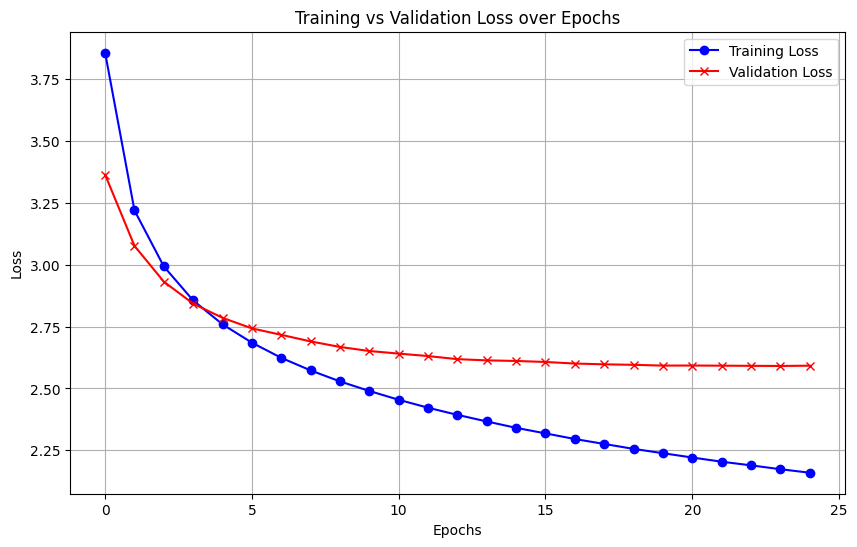

In [14]:
# Loss Curve Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss', color='blue', marker='o')
plt.plot(val_losses, label='Validation Loss', color='red', marker='x')
plt.title("Training vs Validation Loss over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

### Inference Function (Greedy & Beam Search)

* Greedy Search: It picks up only the word with the highest probability at each step.

* Beam Search: It checks multiple sequences simultaneously so that better and longer sentences can be formed.

## Greedy Search Implementation

In [15]:
def caption_image_refined(model, feature, vocab, max_length=50):
    result_caption = []
    model.eval()

    with torch.no_grad():
        feature = torch.tensor(feature).unsqueeze(0).to(device)
        encoded_feature = model.encoderCNN(feature).unsqueeze(1)
        states = None

        # Start token
        input_word = torch.tensor([vocab.stoi["<start>"]]).to(device).unsqueeze(0)

        for _ in range(max_length):
            if _ == 0:
                hiddens, states = model.decoderRNN.lstm(encoded_feature, states)
            else:
                embeddings = model.decoderRNN.embed(input_word)
                hiddens, states = model.decoderRNN.lstm(embeddings, states)

            output = model.decoderRNN.linear(hiddens.squeeze(1))
            predicted = output.argmax(1)

            # Stop at <end>
            if vocab.itos[predicted.item()] == "<end>":
                break


            if vocab.itos[predicted.item()] != "<start>":
                result_caption.append(vocab.itos[predicted.item()])

            input_word = predicted.unsqueeze(0)

    return ' '.join(result_caption)
print("Inference function ready.")

Inference function ready.


### Visualizing Random Results

### --> On 15 epoch Test model random:

In [ ]:
# def show_random_results_refined(df, features_dict, model, vocab, num_images=5):
#     img_col = 'image_name' if 'image_name' in df.columns else 'image'
#     cap_col = 'caption'

#     random_indices = random.sample(range(len(df)), num_images)

#     for idx in random_indices:
#         img_name = df.iloc[idx][img_col]
#         ground_truth = df.iloc[idx][cap_col]

#         if img_name in features_dict:
#             feature = features_dict[img_name]
#             generated_caption = caption_image_refined(model, feature, vocab)

#             img_path = f'/kaggle/input/flickr30k/Images/{img_name}'
#             if os.path.exists(img_path):
#                 img = Image.open(img_path)
#                 plt.figure(figsize=(6, 6))
#                 plt.imshow(img)
#                 plt.title(f"GT: {ground_truth}\nModel: {generated_caption}")
#                 plt.axis("off")
#                 plt.show()

# show_random_results_refined(df, features_dict, model, vocab)

### -->On 25 Epoch Model Test by greedy Approach

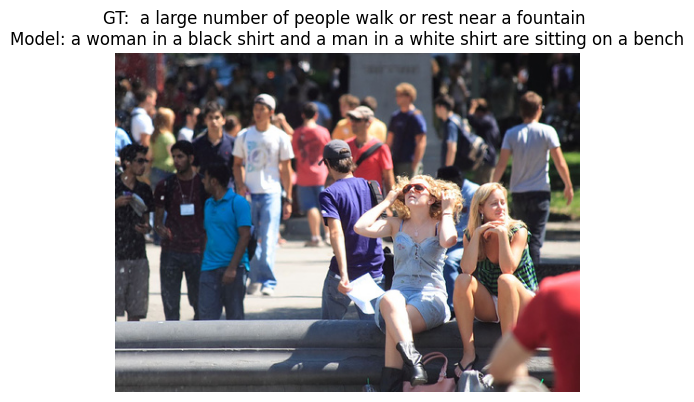

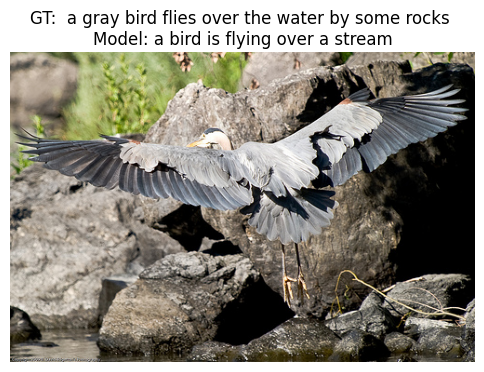

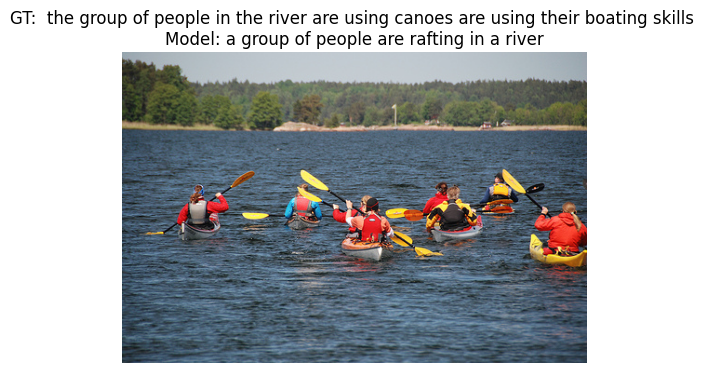

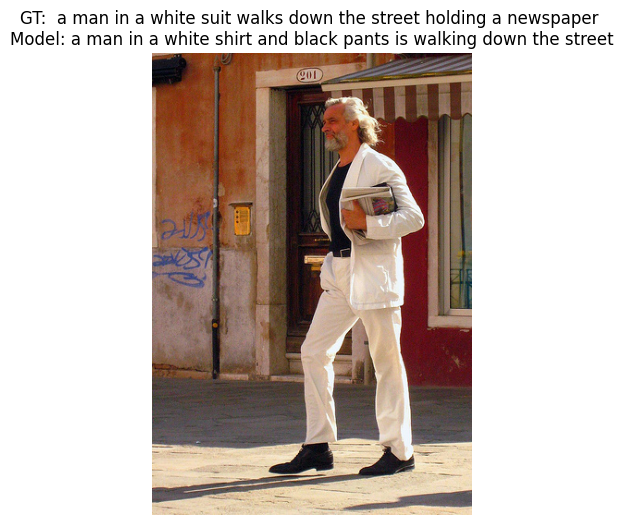

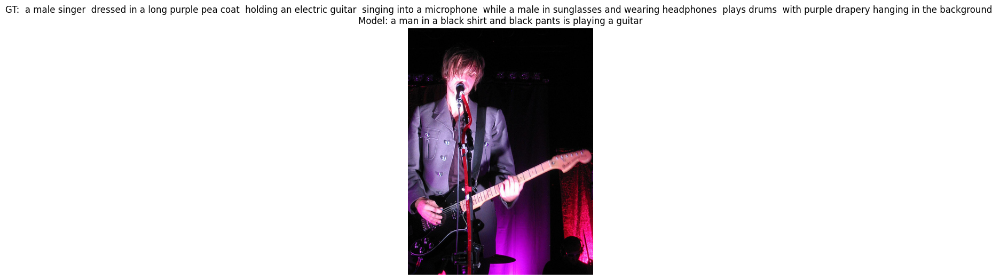

In [17]:
def show_random_results_refined(df, features_dict, model, vocab, num_images=5):
    img_col = 'image_name' if 'image_name' in df.columns else 'image'
    cap_col = 'caption'

    random_indices = random.sample(range(len(df)), num_images)

    for idx in random_indices:
        img_name = df.iloc[idx][img_col]
        ground_truth = df.iloc[idx][cap_col]

        if img_name in features_dict:
            feature = features_dict[img_name]
            generated_caption = caption_image_refined(model, feature, vocab)

            img_path = f'/kaggle/input/flickr30k/Images/{img_name}'
            if os.path.exists(img_path):
                img = Image.open(img_path)
                plt.figure(figsize=(6, 6))
                plt.imshow(img)
                plt.title(f"GT: {ground_truth}\nModel: {generated_caption}")
                plt.axis("off")
                plt.show()

show_random_results_refined(df, features_dict, model, vocab)

### Quantitative Evaluation (BLEU Score)

--> On 15 epoch model

In [18]:
# from nltk.translate.bleu_score import sentence_bleu
# import random

# def calculate_bleu(df, features_dict, model, vocab):
#     # Set Model into evaluation mode
#     model.eval()
#     bleu_scores = []

#     img_col = 'image_name' if 'image_name' in df.columns else 'image'
#     cap_col = 'caption'

#     # we can check for first 100 samplet its speed
#     indices = random.sample(range(len(df)), 100)

#     for idx in indices:
#         img_name = df.iloc[idx][img_col]
#         ground_truth = df.iloc[idx][cap_col].split()

#         feature = features_dict[img_name]
#         generated = caption_image(model, feature, vocab).split()

#         # BLEU-4 calculation
#         # Weights (0.25 each) for n-grams up to 4
#         score = sentence_bleu([ground_truth], generated, weights=(0.25, 0.25, 0.25, 0.25))
#         bleu_scores.append(score)

#     avg_bleu = sum(bleu_scores) / len(bleu_scores)
#     print(f"Average BLEU-4 Score on 100 samples: {avg_bleu:.4f}")

# # Calculate the score
# calculate_bleu(df, features_dict, model, vocab)

--> On 25 epoch model

In [20]:
from nltk.translate.bleu_score import sentence_bleu
import random

def calculate_bleu(df, features_dict, model, vocab):
    # Set Model into evaluation mode
    model.eval()
    bleu_scores = []

    img_col = 'image_name' if 'image_name' in df.columns else 'image'
    cap_col = 'caption'

    # we can check for first 100 samplet its speed
    indices = random.sample(range(len(df)), 100)

    for idx in indices:
        img_name = df.iloc[idx][img_col]
        ground_truth = df.iloc[idx][cap_col].split()

        feature = features_dict[img_name]
        generated = caption_image_refined(model, feature, vocab).split()

        # BLEU-4 calculation
        # Weights (0.25 each) for n-grams up to 4
        score = sentence_bleu([ground_truth], generated, weights=(0.25, 0.25, 0.25, 0.25))
        bleu_scores.append(score)

    avg_bleu = sum(bleu_scores) / len(bleu_scores)
    print(f"Average BLEU-4 Score on 100 samples: {avg_bleu:.4f}")

# Calculate the score
calculate_bleu(df, features_dict, model, vocab)

/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

Average BLEU-4 Score on 100 samples: 0.0212


## Beam Search Implementation

In [21]:
def beam_search_caption(model, feature, vocab, beam_size=3, max_length=50):
    """
    Generate a caption using Beam Search to improve sentence quality.
    """
    model.eval()

    # Prepare initial feature vector
    feature = torch.tensor(feature).unsqueeze(0).to(device)
    encoded_feature = model.encoderCNN(feature).unsqueeze(1)

    # Starting sequence: (log_probability, current_sentence, hidden_state)
    start_token = vocab.stoi["<start>"]
    beams = [(0, [start_token], None)]

    completed_sequences = []

    with torch.no_grad():
        for _ in range(max_length):
            new_beams = []
            for score, seq, states in beams:
                if seq[-1] == vocab.stoi["<end>"]:
                    completed_sequences.append((score, seq))
                    continue

                # Input for current step
                if len(seq) == 1:
                    # first step: input Image features
                    hiddens, new_states = model.decoderRNN.lstm(encoded_feature, states)
                else:
                    # Next steps: input Previous predicted word
                    last_word = torch.tensor([seq[-1]]).to(device).unsqueeze(0)
                    embeddings = model.decoderRNN.embed(last_word)
                    hiddens, new_states = model.decoderRNN.lstm(embeddings, states)

                # Get probabilities for all words
                output = model.decoderRNN.linear(hiddens.squeeze(1))
                log_probs = torch.log_softmax(output, dim=1)

                # Top k candidates select krain (k = beam_size)
                top_probs, top_indices = log_probs.topk(beam_size)

                for i in range(beam_size):
                    new_score = score + top_probs[0][i].item()
                    new_seq = seq + [top_indices[0][i].item()]
                    new_beams.append((new_score, new_seq, new_states))

            # Carry forward only top beam_size sequences
            beams = sorted(new_beams, key=lambda x: x[0], reverse=True)[:beam_size]

            # If you've run out of all sequences
            if all(s[-1] == vocab.stoi["<end>"] for _, s, _ in beams):
                break

        # Final score calculation
        completed_sequences.extend([(s, seq) for s, seq, _ in beams])
        completed_sequences.sort(key=lambda x: x[0], reverse=True)

        # Pick the best sequence and convert tokens to words
        best_seq = completed_sequences[0][1]
        final_caption = [vocab.itos[idx] for idx in best_seq if idx not in [vocab.stoi["<start>"], vocab.stoi["<end>"], vocab.stoi["<pad>"]]]

        return ' '.join(final_caption)

print("Beam Search function is ready!")

Beam Search function is ready!


### Compare Greedy vs Beam Search

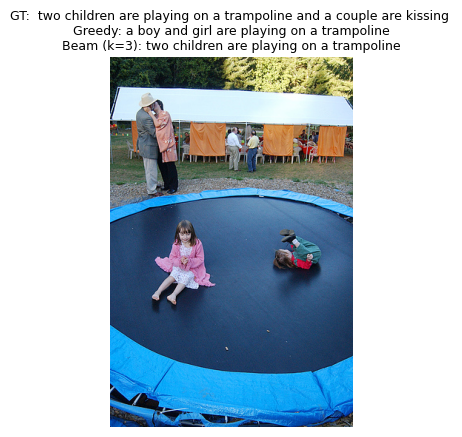

In [22]:
def compare_search_methods(df, features_dict, model, vocab, beam_size=3):
    img_col = 'image_name' if 'image_name' in df.columns else 'image'
    cap_col = 'caption'

    # Pick a random test image
    idx = random.randint(0, len(df)-1)
    img_name = df.iloc[idx][img_col]
    ground_truth = df.iloc[idx][cap_col]
    feature = features_dict[img_name]

    # Generate using both methods
    greedy_cap = caption_image_refined(model, feature, vocab)
    beam_cap = beam_search_caption(model, feature, vocab, beam_size=beam_size)

    # Display
    img_path = f'/kaggle/input/flickr30k/Images/{img_name}'
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title(f"GT: {ground_truth}\nGreedy: {greedy_cap}\nBeam (k={beam_size}): {beam_cap}", fontsize=9)
    plt.axis("off")
    plt.show()

# Run the comparison
compare_search_methods(df, features_dict, model, vocab)

# Random Comparison (Greedy & Beam) on 15 Epoch

In [23]:
# import random
# import os
# from PIL import Image
# import matplotlib.pyplot as plt

# def run_random_comparisons(df, features_dict, model, vocab, num_images=5, beam_size=3):
#     """
#     Pick random images and compare Greedy vs Beam Search predictions.
#     """
#     img_col = 'image_name' if 'image_name' in df.columns else 'image'
#     cap_col = 'caption'

#     # Selecting random samples
#     indices = random.sample(range(len(df)), num_images)

#     for idx in indices:
#         img_name = df.iloc[idx][img_col]
#         ground_truth = df.iloc[idx][cap_col]

#         if img_name in features_dict:
#             feature = features_dict[img_name]

#             # Generate using both methods
#             # Greedy prediction (using the refined function)
#             greedy_output = caption_image_refined(model, feature, vocab)

#             # Beam Search prediction
#             beam_output = beam_search_caption(model, feature, vocab, beam_size=beam_size)

#             # Image path
#             img_path = f'/kaggle/input/flickr30k/Images/{img_name}'

#             if os.path.exists(img_path):
#                 img = Image.open(img_path)
#                 plt.figure(figsize=(8, 8))
#                 plt.imshow(img)
#                 plt.title(f"GT: {ground_truth}\nGreedy: {greedy_output}\nBeam (k={beam_size}): {beam_output}",
#                           fontsize=10, color='blue')
#                 plt.axis("off")
#                 plt.show()

# run_random_comparisons(df, features_dict, model, vocab)

## Quantitative Evaluation (BLEU, Precision, Recall, F1)
* ### Precision: How many of the words the model said were correct.

* ### Recall: How many of the ground truth words the model picked.

* ### F1-Score: The balance of precision and recall.

* ### BLEU-4: Checks the matching of N-grams (sequences of 4 words).

In [24]:
# from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
# from sklearn.metrics import precision_score, recall_score, f1_score
# import numpy as np

# def calculate_all_metrics(df, features_dict, model, vocab, num_samples=100):
#     model.eval()
#     img_col = 'image_name' if 'image_name' in df.columns else 'image'
#     cap_col = 'caption'

#     bleu_scores = []
#     all_precisions = []
#     all_recalls = []
#     all_f1s = []

#     indices = random.sample(range(len(df)), num_samples)
#     smoothie = SmoothingFunction().method4 # To handle short captions

#     print(f"Calculating metrics for {num_samples} samples...")

#     for idx in indices:
#         img_name = df.iloc[idx][img_col]
#         # Ground truth and prediction as lists of tokens
#         reference = df.iloc[idx][cap_col].split()
#         candidate = beam_search_caption(model, features_dict[img_name], vocab).split()

#         # 1. BLEU-4 Score
#         score = sentence_bleu([reference], candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)
#         bleu_scores.append(score)

#         # 2. Token-level Precision, Recall, F1
#         # We use sets of words to compare overlapping tokens
#         ref_set = set(reference)
#         cand_set = set(candidate)

#         if len(cand_set) == 0:
#             p, r, f = 0, 0, 0
#         else:
#             tp = len(ref_set.intersection(cand_set)) # True Positives
#             p = tp / len(cand_set)
#             r = tp / len(ref_set)
#             f = (2 * p * r) / (p + r) if (p + r) > 0 else 0

#         all_precisions.append(p)
#         all_recalls.append(r)
#         all_f1s.append(f)

#     print("-" * 30)
#     print(f"Average BLEU-4 Score: {np.mean(bleu_scores):.4f}")
#     print(f"Average Precision:   {np.mean(all_precisions):.4f}")
#     print(f"Average Recall:      {np.mean(all_recalls):.4f}")
#     print(f"Average F1-Score:    {np.mean(all_f1s):.4f}")
#     print("-" * 30)

# # Run the evaluation
# calculate_all_metrics(df, features_dict, model, vocab)

# --> Comparsion Greedy vs Beam on 25 Epoch

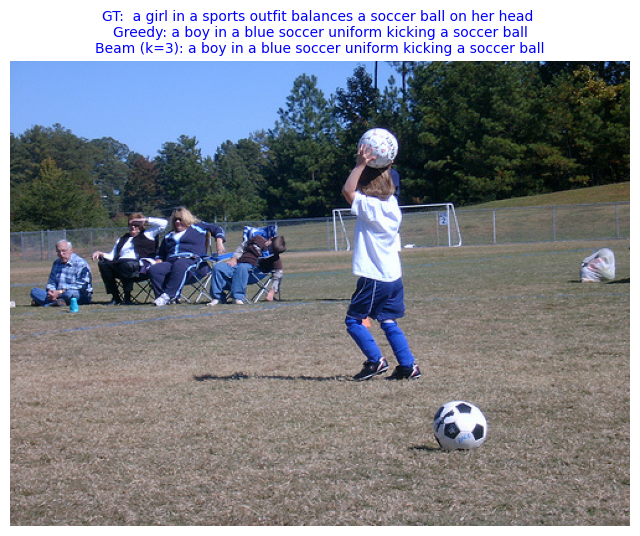

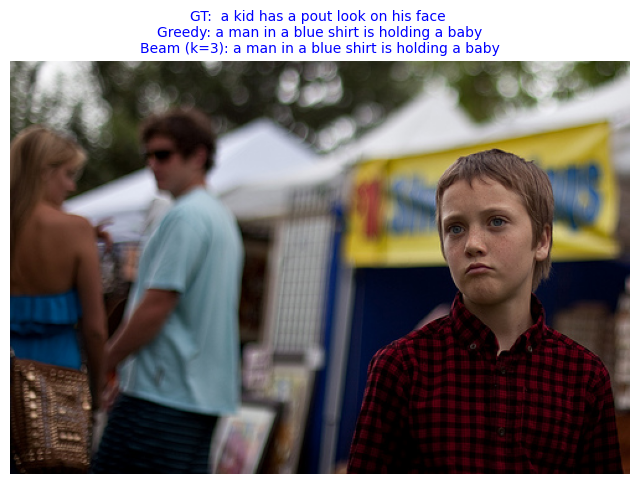

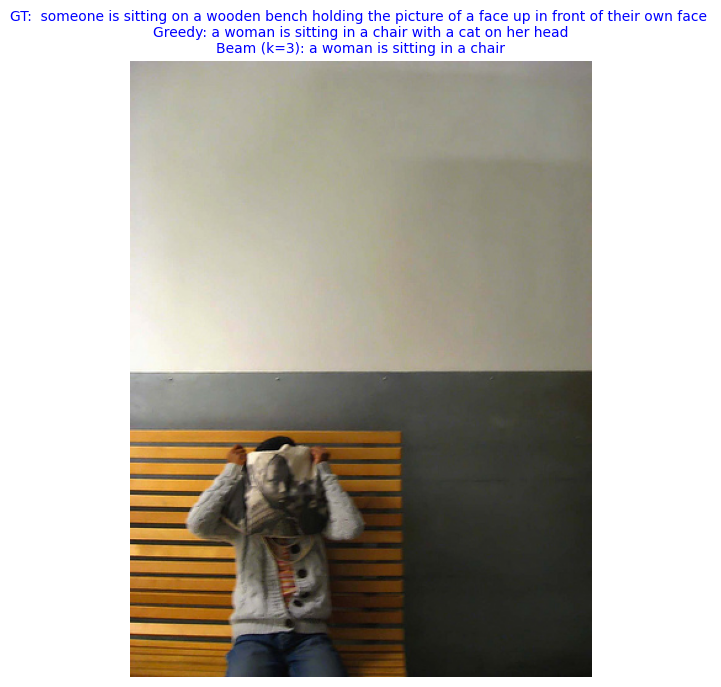

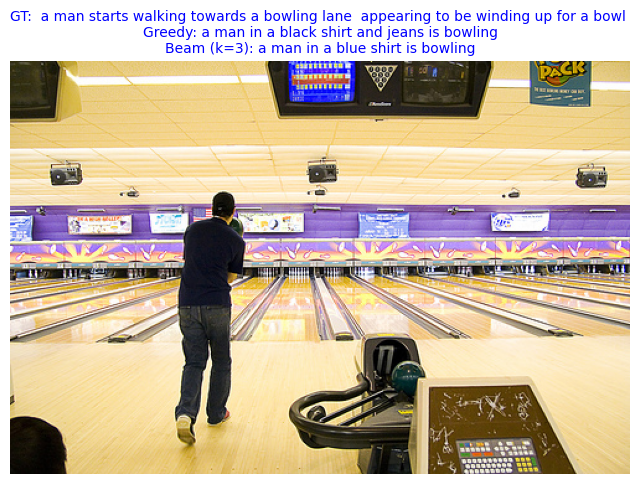

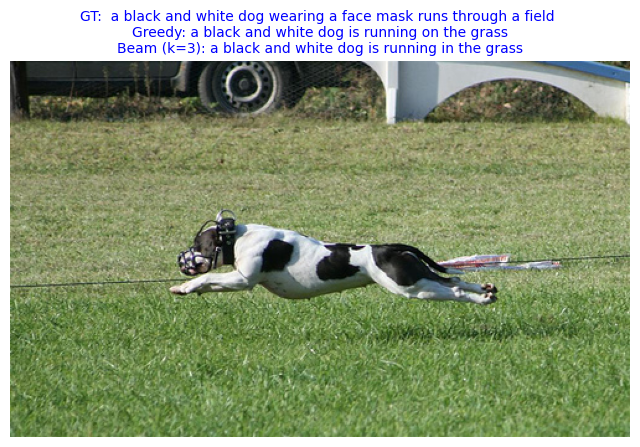

In [25]:
def run_random_comparisons(df, features_dict, model, vocab, num_images=5, beam_size=3):
    """
    Pick random images and compare Greedy vs Beam Search predictions.
    """
    img_col = 'image_name' if 'image_name' in df.columns else 'image'
    cap_col = 'caption'

    # Selecting random samples
    indices = random.sample(range(len(df)), num_images)

    for idx in indices:
        img_name = df.iloc[idx][img_col]
        ground_truth = df.iloc[idx][cap_col]

        if img_name in features_dict:
            feature = features_dict[img_name]

            # Generate using both methods
            # Greedy prediction (using the refined function)
            greedy_output = caption_image_refined(model, feature, vocab)

            # Beam Search prediction
            beam_output = beam_search_caption(model, feature, vocab, beam_size=beam_size)

            # Image path
            img_path = f'/kaggle/input/flickr30k/Images/{img_name}'

            if os.path.exists(img_path):
                img = Image.open(img_path)
                plt.figure(figsize=(8, 8))
                plt.imshow(img)
                plt.title(f"GT: {ground_truth}\nGreedy: {greedy_output}\nBeam (k={beam_size}): {beam_output}",
                          fontsize=10, color='blue')
                plt.axis("off")
                plt.show()

run_random_comparisons(df, features_dict, model, vocab)

## Quantitative Evaluation (BLEU, Precision, Recall, F1)

In [26]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

def calculate_all_metrics(df, features_dict, model, vocab, num_samples=100):
    model.eval()
    img_col = 'image_name' if 'image_name' in df.columns else 'image'
    cap_col = 'caption'

    bleu_scores = []
    all_precisions = []
    all_recalls = []
    all_f1s = []

    indices = random.sample(range(len(df)), num_samples)
    smoothie = SmoothingFunction().method4 # To handle short captions

    print(f"Calculating metrics for {num_samples} samples...")

    for idx in indices:
        img_name = df.iloc[idx][img_col]
        # Ground truth and prediction as lists of tokens
        reference = df.iloc[idx][cap_col].split()
        candidate = beam_search_caption(model, features_dict[img_name], vocab).split()

        # 1. BLEU-4 Score
        score = sentence_bleu([reference], candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)
        bleu_scores.append(score)

        # 2. Token-level Precision, Recall, F1
        # We use sets of words to compare overlapping tokens
        ref_set = set(reference)
        cand_set = set(candidate)

        if len(cand_set) == 0:
            p, r, f = 0, 0, 0
        else:
            tp = len(ref_set.intersection(cand_set)) # True Positives
            p = tp / len(cand_set)
            r = tp / len(ref_set)
            f = (2 * p * r) / (p + r) if (p + r) > 0 else 0

        all_precisions.append(p)
        all_recalls.append(r)
        all_f1s.append(f)

    print("-" * 30)
    print(f"Average BLEU-4 Score: {np.mean(bleu_scores):.4f}")
    print(f"Average Precision:   {np.mean(all_precisions):.4f}")
    print(f"Average Recall:      {np.mean(all_recalls):.4f}")
    print(f"Average F1-Score:    {np.mean(all_f1s):.4f}")
    print("-" * 30)

# Run the evaluation
calculate_all_metrics(df, features_dict, model, vocab)

Calculating metrics for 100 samples...
------------------------------
Average BLEU-4 Score: 0.0989
Average Precision:   0.3775
Average Recall:      0.3331
Average F1-Score:    0.3442
------------------------------


## Model Save

In [27]:
# Save the model state and vocabulary for the app
checkpoint = {
    "state_dict": model.state_dict(),
    "optimizer": optimizer.state_dict(),
    "vocab": vocab,
    "embed_size": embed_size,
    "hidden_size": hidden_size,
    "num_layers": num_layers
}
torch.save(checkpoint, "flickr30k_model.pth")
print("Model and Vocab saved successfully as 'flickr30k_model.pth'!")

Model and Vocab saved successfully as 'flickr30k_model.pth'!


### Model and Features Download

In [ ]:
# from google.colab import files

# # Downloading the trained model weights
# print("Downloading model weights...")
# files.download('flickr30k_model.pth')

# # Downloading the extracted image features
# print("Downloading features pickle file...")
# files.download('flickr30k_features.pkl')

### App Deployment

In [28]:
import gradio as gr

def predict_caption_v2(input_image, search_method):
    """
    Enhanced prediction function with Greedy and Beam Search options.
    """
    # 1. Image Preprocessing
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])
    img_t = transform(input_image).unsqueeze(0).to(device)

    # 2. Feature Extraction
    with torch.no_grad():
        # Using the feature extractor part of our architecture
        cnn_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        cnn_model = nn.Sequential(*list(cnn_model.children())[:-1]).to(device)
        cnn_model.eval()
        feature = cnn_model(img_t).view(1, -1).cpu().numpy()

    # 3. Search Method Selection
    if search_method == "Greedy":
        caption = caption_image_refined(model, feature.squeeze(0), vocab)
    else:
        caption = beam_search_caption(model, feature.squeeze(0), vocab, beam_size=3)

    return caption

# Gradio Interface Setup
interface = gr.Interface(
    fn=predict_caption_v2,
    inputs=[
        gr.Image(type="pil", label="Upload Image"),
        gr.Radio(["Greedy", "Beam Search"], label="Select Search Method", value="Beam Search")
    ],
    outputs=gr.Textbox(label="Generated Caption", lines=3, interactive=False),
    title="Neural Storyteller - Generative AI",
    description="Choose a method and upload an image to generate a caption."
)

interface.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://26f5fc5081a4368026.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


---> ON 15 Epoch Results:

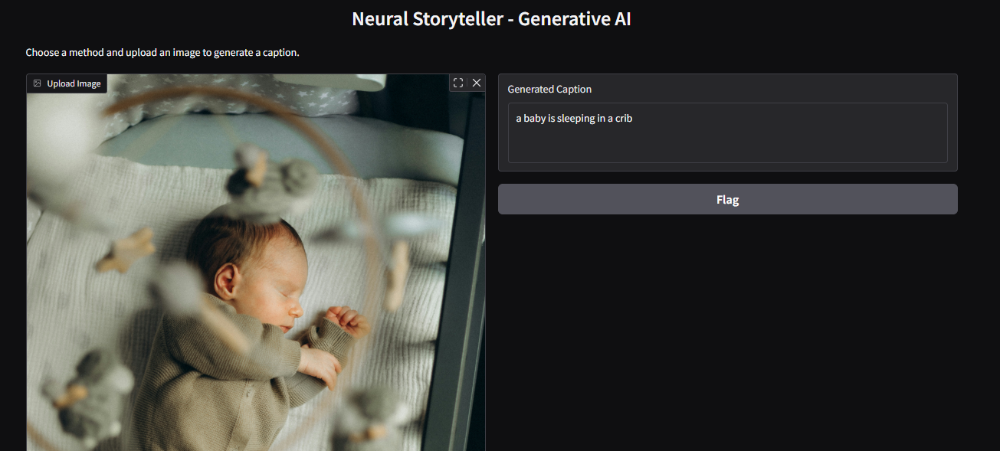

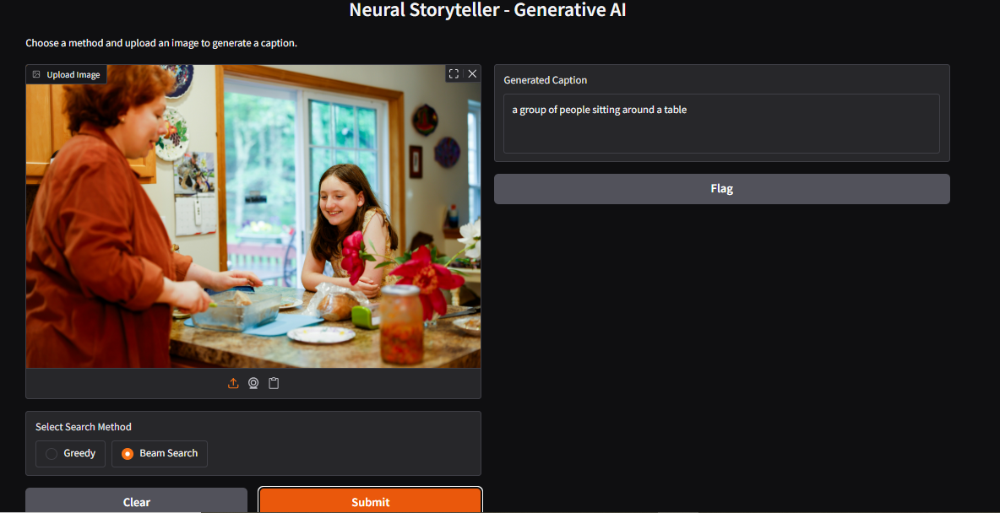

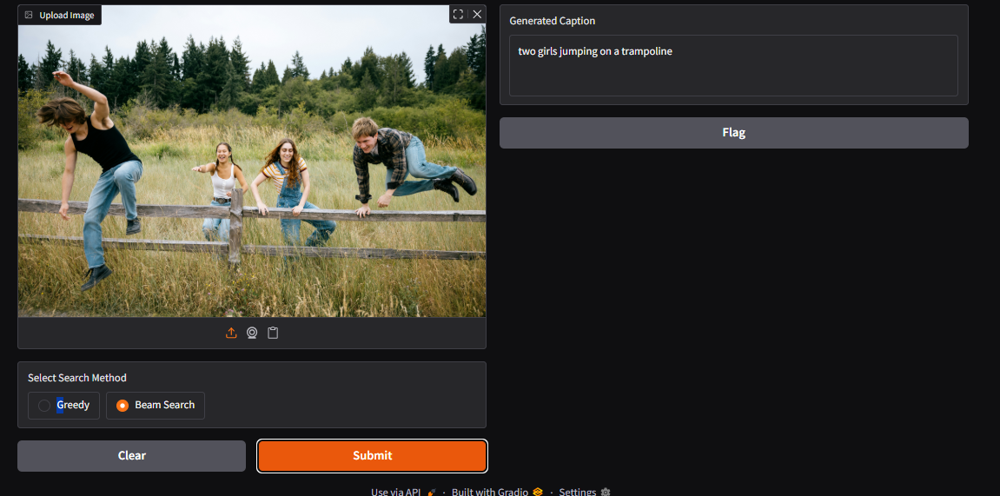

--> On 25 Epoch Test

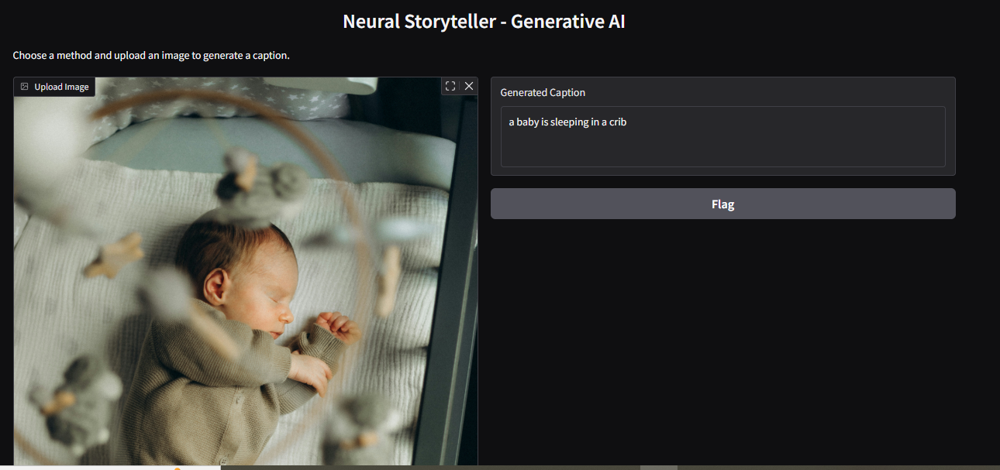

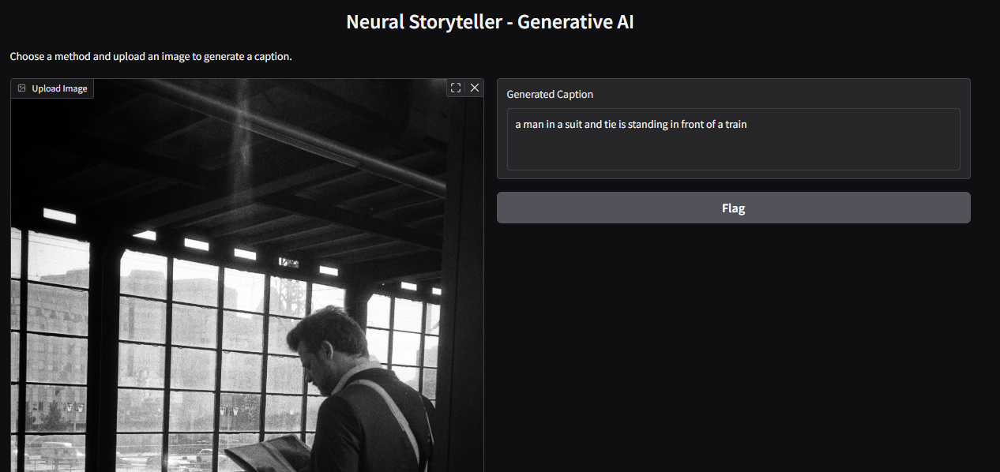

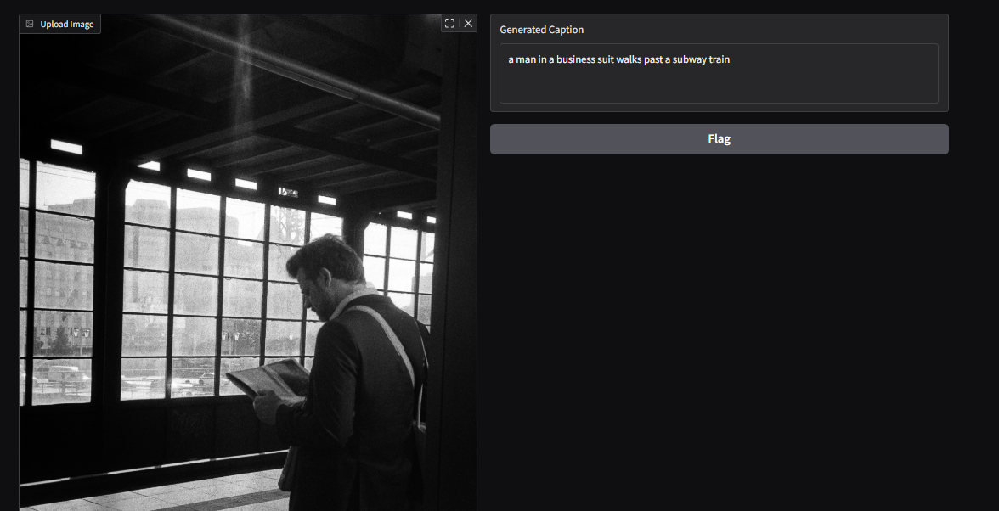

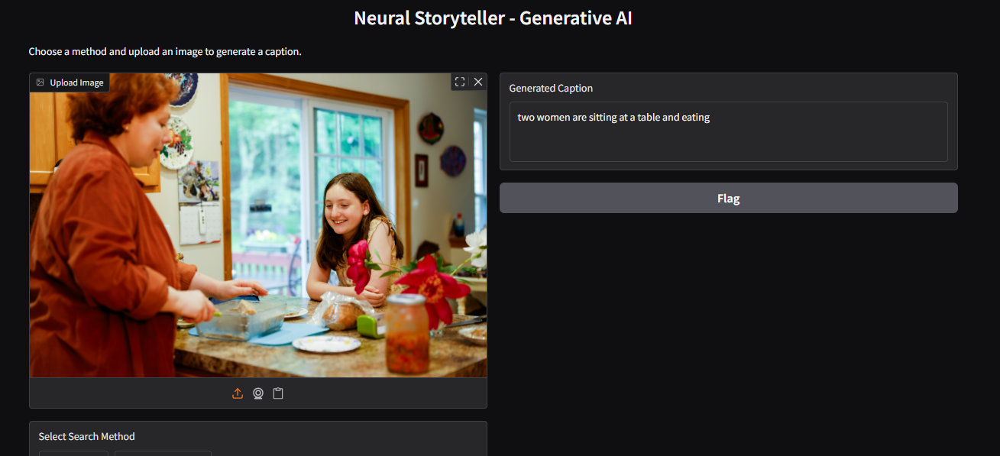

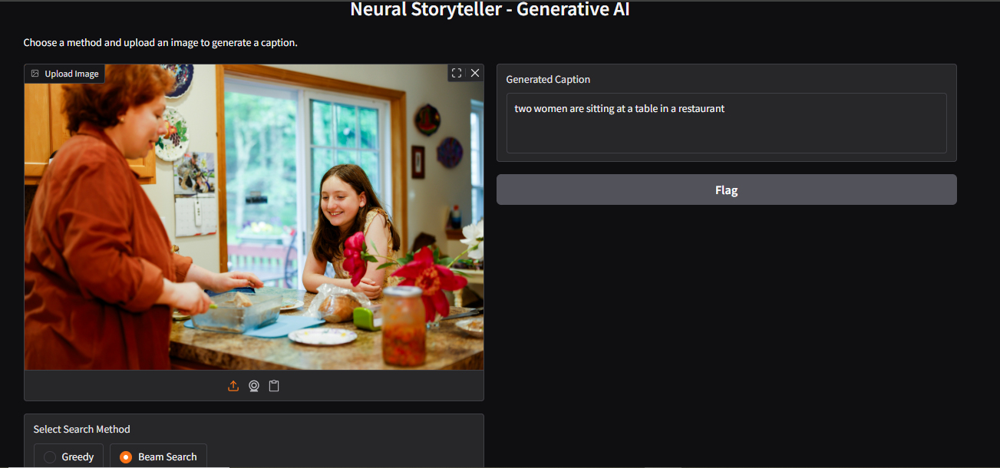

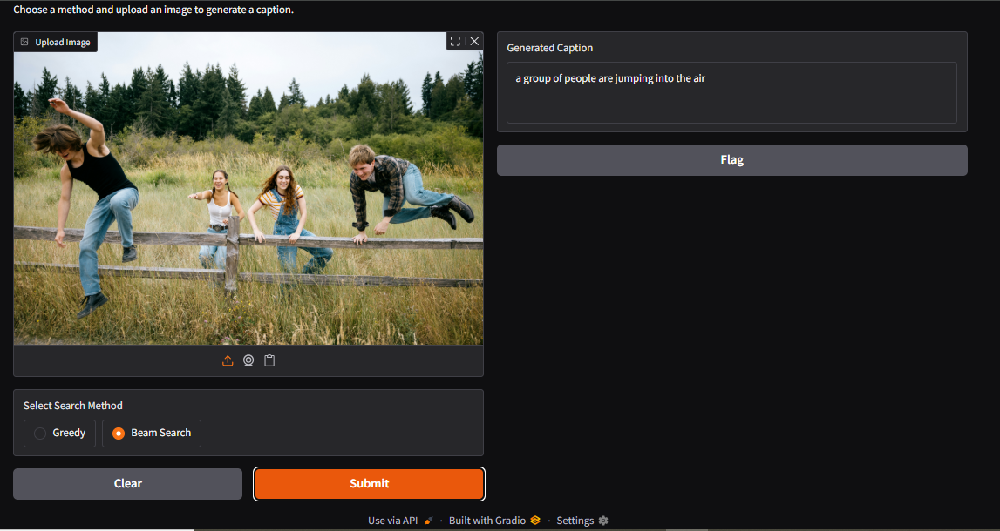